#   Basic Image operations  - undertsand colour images  

# Image Basics 

## Objectives 
- 1 Read Display and Save Images 
- 2 Accessing the Image arrays with the NumPy library and basic image  manipulations
- 3 Colours in an image
- 4 Convert an image to grayscale

## Prepare the enviroment 

First of all we create the enviroments that we will work with. It is good practice to do in order to be sure that we all work at the same versions of the packcages and libraries we use.
**Use the following commands in the command line and not at notebooks**

In [ ]:
# 1st
## conda create -n carpentry-images -c conda-forge python=3.7 ipympl ***** Add it python=3.8

In [ ]:
# 2nd 
#conda activate carpentry-images


In [ ]:
# 3rd
#conda install -c conda-forge ipympl

In [ ]:

#4th 
#conda install -c conda-forge jupyterlab

In [ ]:
# I am not sure if this works 
##!jupyter labextension list

In [ ]:
#
## conda install -c conda-forge scikit-image scikit-learn

### Import Image analysis libraries 

We need to import the Nympy library for numerical calculations and the  matplotlib library, to gain access to the tools to plot image analytics such like histograms. The statement from matplotlib import pyplot as plt, loads up the pyplot library, and gives it a shorter name, plt.

Next, we use the skimage library which is the main for image processing. The skimage.io.imread() function is for loading our images.


In [38]:
"""
 * Python libraries for learning and performing image processing.*
"""
import numpy as np     #Form 1, load all of numpy library into an object called np
import matplotlib.pyplot as plt #Form 1: load from matplotlib library the pyplot module into an object called plt
import skimage         #Form 2, load all the skimage library
import skimage.io      #Form 3, load skimage.io module only
import skimage.viewer   # Form 3, load skimage.viewer module only
import skimage.color    # Form 3, load skimage.color module only
import ipympl      

In [39]:
%matplotlib widget

## 1 How to Read, Display and Save images 

Skimage provides easy-to-use functions for reading, displaying, and saving images. All of the popular image formats, such as BMP, PNG, JPEG, and TIFF are supported.

First, we import the **io module of skimage (skimage.io)** so we can read and write images. Then, we use the **skimage.io.imread()** function to read a JPEG image entitled chair.jpg. Skimage reads the image, converts it from JPEG into a NumPy array, and returns the array; we save the array in a variable named image.

Let us examine a simple Python program to load, display, and save an image to a different format. Here we present how to images from a folder of your computer and from the internet. I have included the whole script and its essential to keep it.

## 1.1 Import (Read)  from the hard drive of the computer  

Let us load our image data from a folder using the imread function from the skimage.io library and display it using the imshow function from the matplotlib library.
Go to the sc_data directory (which is in the directory of this Jupyter Notebook) and find the image we want.

### Read

In [3]:
# Read an image from a folder 
image = skimage.io.imread(fname='sc_data/astronaut.tif')# from the sc_data directory (folder) choose the astronaut.bmp image

Once we have the image in the program, we first call plt.subplots() so that we will have a fresh figure with a set of axis independent from our previous calls. Next we call plt.imshow() to display the image.

### Display

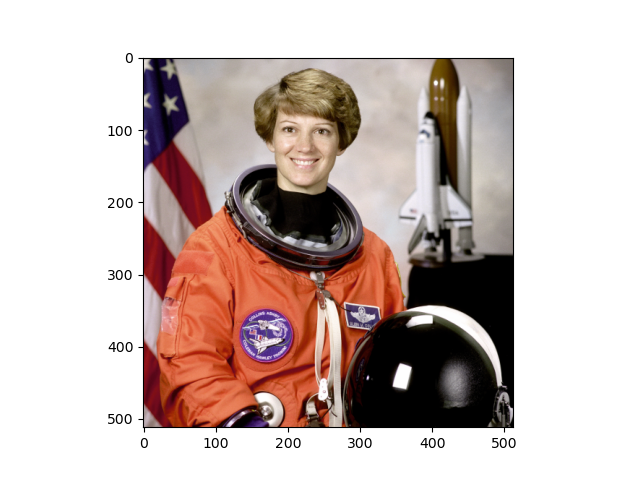

In [4]:
# Display the image
fig, ax = plt.subplots()
plt.imshow(image)
#plt.colorbar()

### Save

Now, we will save the image in another format:

In [28]:
# save a new version in .jpg format
skimage.io.imsave(fname="sc_data/astronaut.jpg", arr=image)

The final statement in the program, skimage.io.imsave(fname="astronaut.jpg", arr=image), writes the image to a file named astronaut.jpg in the sc_data/ directory. The imsave() function automatically determines the type of the file, based on the file extension we provide. In this case, the .jpg extension causes the image to be saved as a JPEG.

#### Script

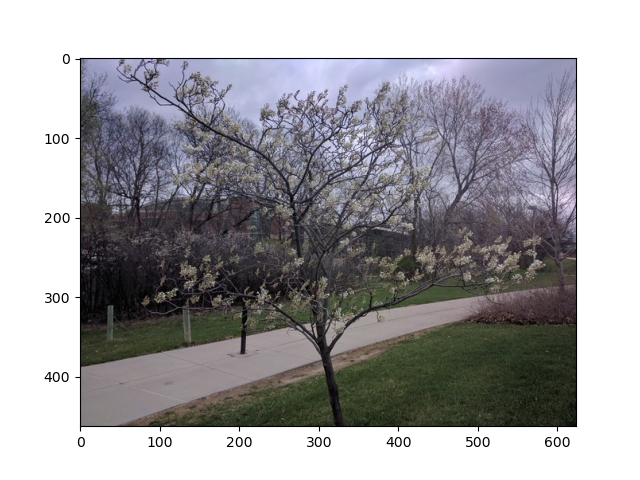

In [33]:
"""
 * Python script to open, display, and save an image.
 *
"""

# read image
image = skimage.io.imread(fname="sc_data/tree.jpg")

# Display the image
fig, ax = plt.subplots()
plt.imshow(image)

# save a new version in .tif format
skimage.io.imsave(fname="sc_data/tree.tif", arr=image)

## 1.2 Read image from the web

In [10]:
#First create a filemane  
face_path = 'face.jpg'

### Import requests library

In [14]:
%pip install --quiet requests
import requests
url = 'https://thispersondoesnotexist.com/image'
request = requests.get(url)
with open(face_path, 'wb') as f:
    f.write(request.content)

Note: you may need to restart the kernel to use updated packages.


### Display the image

In [36]:
face_image=plt.imread(face_path)

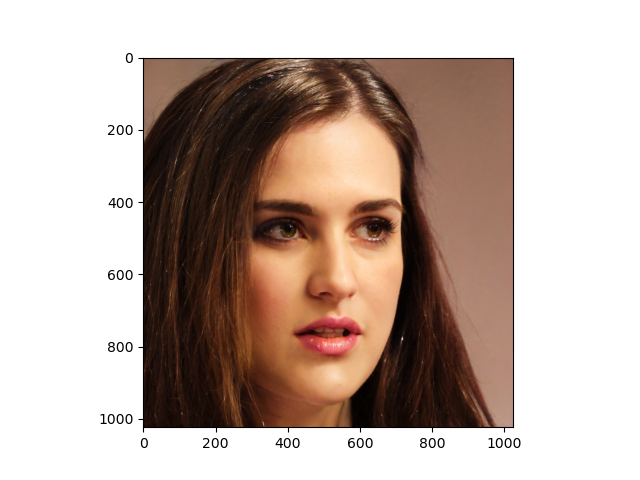

In [37]:
fig, ax = plt.subplots()
plt.imshow(face_image)

### Save the image

In [30]:
# save a new version in .tif format
skimage.io.imsave(fname="sc_data/face_x.tif", arr=face_image)

#### Explore image informations

In [38]:
array = plt.imread(face_path)
print('Data type:    ', array.dtype)
print('Shape:        ', array.shape)
print('Element size: ', array.itemsize)
print('Num. elements:', array.size)
print('Num. bytes:   ', array.nbytes)

Data type:     uint8
Shape:         (1024, 1024, 3)
Element size:  1
Num. elements: 3145728
Num. bytes:    3145728


## 2. Image as a NymPy array 

We have seen that images are stored as matrixes (arrays) of numbers. Thus if we have tools that will allow us to manipulate these arrays of numbers, we can manage the image and its pixels. The NumPy library can be particularly useful here.

For simplicity let's load a small image and see how by using the NumPy library we can locate pixels and make changes in the image.

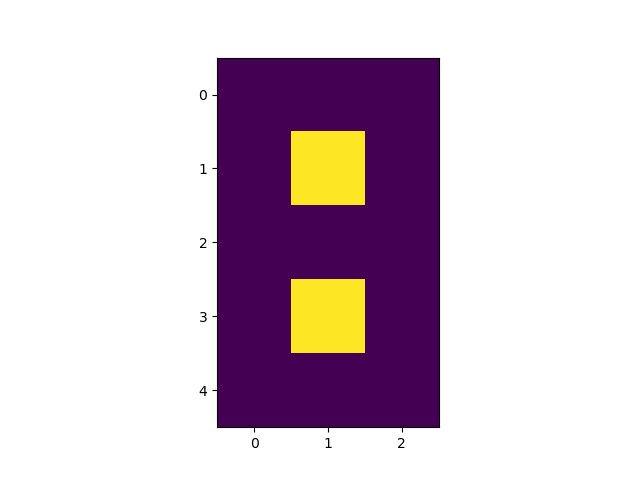

In [105]:
#Read 
image = skimage.io.imread(fname="sc_data/eight.tif")
#Display 
fig, ax = plt.subplots()
plt.imshow(image)

In [11]:
array = image
print('Data type:    ', array.dtype)
print('Shape:        ', array.shape)
print('Element size: ', array.itemsize)
print('Num. elements:', array.size)
print('Num. bytes:   ', array.nbytes)

Data type:     float64
Shape:         (5, 3)
Element size:  8
Num. elements: 15
Num. bytes:    120


The image  is a 5 x 3 matrix of just 15 pixels. To see the array we just recalll the print function. 

In [106]:
print(image)

[[0. 0. 0.]
 [0. 1. 0.]
 [0. 0. 0.]
 [0. 1. 0.]
 [0. 0. 0.]]


It is a 5-row by 3-column matrix and the pixel values are just 0 and 1. 0 is the dark colour and 1 is the yellow.
By manipulating the numbers we can make changes in the image .

Let's try using the numpy array slicing to make it look like a zero.

To that extent  we need to change the number underlying the centremost pixel to be 1. With the help of those row and column headers, at this small scale we can determine the centre pixel is in row labelled 2 and column labelled 1. We can then address and assign a new value to that position using array slicing.

[[0. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 0. 0.]]


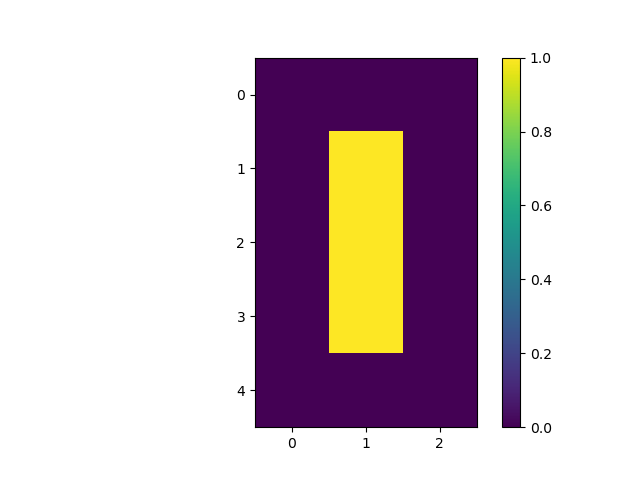

In [17]:
zero = skimage.io.imread(fname="sc_data/eight.tif")
zero[2,1]= 1.0  # row, column
"""
The follwing line of code creates a new figure for imshow to use in displaying our output. Without it, plt.imshow() would overwrite our previous image in the cell above
"""
fig, ax = plt.subplots()
plt.imshow(zero)
print(zero)
plt.colorbar() # set the colourbar on the right side

## Arithmetic operations with an image 

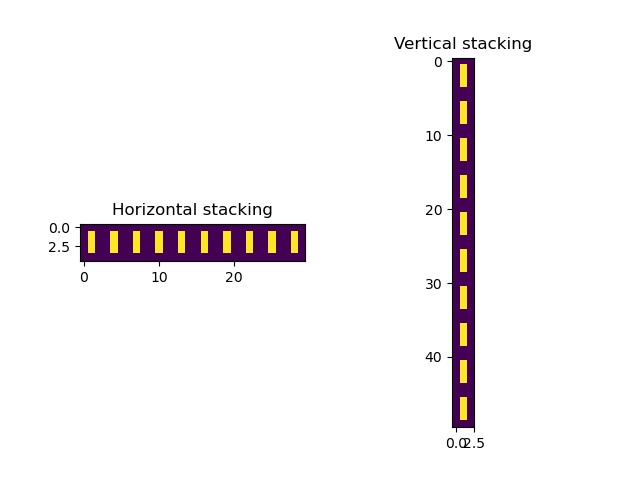

In [104]:
ten_zeros = 10 * [zero] # Multiply the image we have called zero by 10
zero_ten_times_horizontal = np.hstack(ten_zeros)
zero_ten_times_vertical = np.vstack(ten_zeros)
_, axes = plt.subplots(1, 2)
axes[0].imshow(zero_ten_times_horizontal)
axes[0].set_title('Horizontal stacking')
axes[1].imshow(zero_ten_times_vertical)
axes[1].set_title('Vertical stacking')
plt.show()

## Exercise

- a) Load another copy of eight named five, and then change the value of pixels so you have what looks like a 5 instead of an 8. 
- b) Display the image and print out the matrix as well.
- c) Calculate 6 times the image and present it in horizonta stacking.


[[0. 0. 0.]
 [0. 1. 1.]
 [0. 0. 0.]
 [1. 1. 0.]
 [0. 0. 0.]]


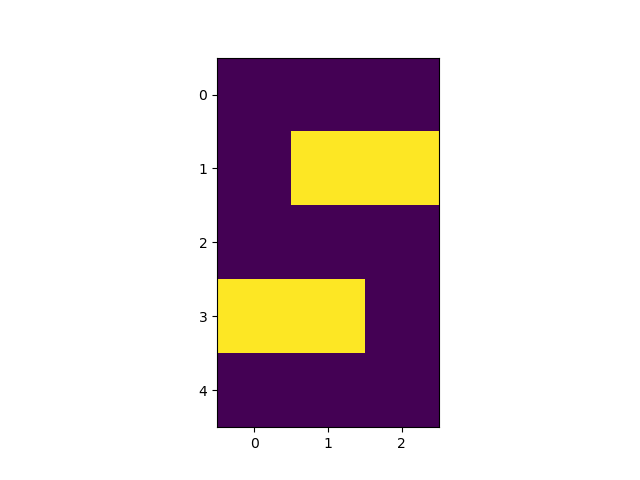

In [109]:
# Load the image of eight from the folder
five = skimage.io.imread(fname="sc_data/eight.tif")
# Use pixel selection (slicing) and change pixel colours to meke the the image look like 5
five[1,2]= 1.0
five[3,0]= 1.0

# Display the image
fig, ax = plt.subplots()
plt.imshow(five)
print(five)



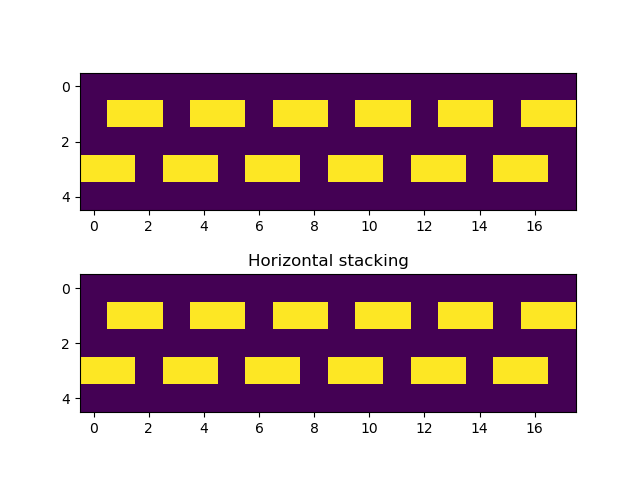

In [116]:

### Make the calculations

six_fives = 6* [five] # Multiply the image we have called five by 6
six_fives_times_horizontal = np.hstack(six_fives)

# Display the image in a 2x1 matrix
_, axes = plt.subplots(2, 1)
plt.imshow(six_fives_times_horizontal)
axes[0].imshow(six_fives_times_horizontal)
axes[1].set_title('Horizontal stacking')
plt.show()

## MY QUESTION 
Why with the above code it plots a horizontal below the 'Horizontal stacking' That supose to be a title under the first stack.

## 3.   Colours in an image 

### Import and malipuate a small image (small array) 

[[  0.   0.   0.]
 [  0. 110.   0.]
 [255. 255. 255.]
 [  0. 110.   0.]
 [  0.   0.   0.]]


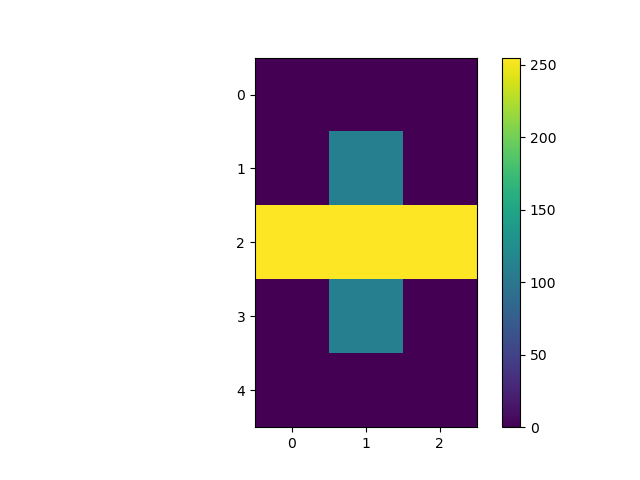

In [90]:
#make a copy of eight
three_colours = skimage.io.imread(fname="sc_data/eight.tif")

#multiply the whole matrix by 128
three_colours = three_colours * 110

# set the middle row (index 2) to the value of 255., so you end up with the values 0.,128.,and 255
three_colours[2,:] = 255.
fig, ax = plt.subplots()
plt.imshow(three_colours)
print(three_colours)
plt.colorbar()

We now have 3 colours, but are they the three colours you expected? They all appear to be on a continuum of dark purple on the low end and yellow on the high end. This is a consequence of the default colour map (cmap) in this library. You can think of a colour map as an association or mapping of numbers to a specific colour. However, the goal here is not to have one number for every possible colour, but rather to have a continuum of colours that demonstrate relative intensity. In our specific case here for example, 255 or the highest intensity is mapped to yellow, and 0 or the lowest intensity is mapped to a dark purple. The best colour map for your data will vary and there are many options built in, but this default selection was not arbitrary. A lot of science went into making this the default due to its robustness when it comes to how the human mind interprets relative colour values, grey-scale printability, and colour-blind friendliness. The original MRI images are in the greyscale colourmap it will be even easier to see it as a mapped continuum of intensities which are ranged from 0 map to black and to 1 maped to white.


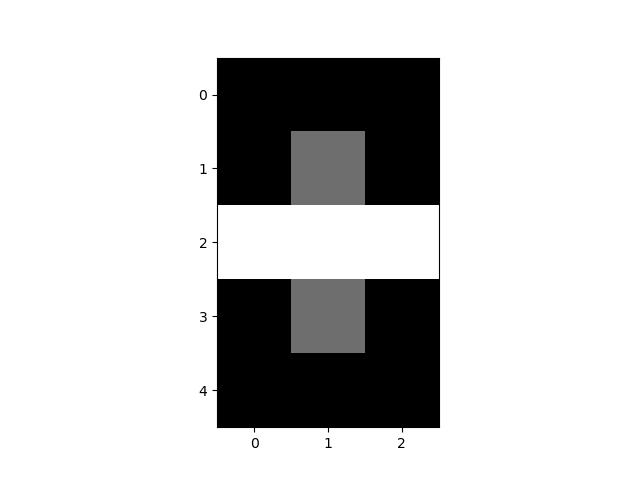

In [66]:
# Visualise the picture in grayscale

fig, ax = plt.subplots()
plt.imshow(three_colours,cmap=plt.cm.gray) 

## From the grayscale [0, 255] to colour scale 

In [48]:
##
# Use the following algorithm to create a line array with 3 channels.
## THIS IS FOR DEMONSTRATION HOW TO GENARATE * COLOUR PIXELS, AND YOU DONT NEED TO UNDERSTAND IT 

#tertools.product() is used to find the cartesian product from the given iterator, output is lexicographic ordered. The itertools.product() can used in two different ways:

#itertools.product(*iterables, repeat=1): It returns the CARTESIAN PRODUCT of the provided iterable with itself for the number of times specified by the optional keyword “repeat”. For example, product(arr, repeat=3) means the same as product(arr, arr, arr).
#itertools.product(*iterables):
#It returns the cartesian product of all the iterable provided as the argument. For example, product(arr1, arr2, arr3).
##

from itertools import product
pixels = list(product((0, 1), repeat=3)) # The list of products of (0, 1) x(0, 1)x (0, 1)
print(pixels)

[(0, 0, 0), (0, 0, 1), (0, 1, 0), (0, 1, 1), (1, 0, 0), (1, 0, 1), (1, 1, 0), (1, 1, 1)]


In [56]:
pixels_image = np.array(pixels)[np.newaxis]
print(pixels_image.shape)
print(pixels_image)

(1, 8, 3)
[[[0 0 0]
  [0 0 1]
  [0 1 0]
  [0 1 1]
  [1 0 0]
  [1 0 1]
  [1 1 0]
  [1 1 1]]]


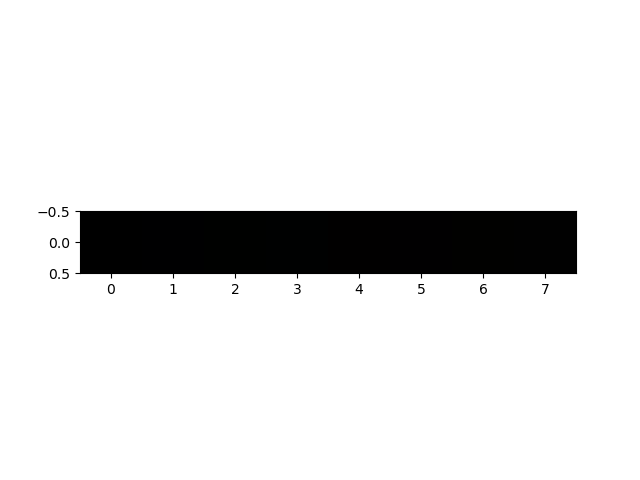

In [57]:
fig, ax = plt.subplots()
plt.imshow(pixels_image)

We have a matrix 1 x 8 that has 3 channels. Each intensity is a number in  a binary form all of them are mapped to black. When we add more colours as before we will be able to see a the spectrum. 


In [67]:
#Multiply with 255 which is the maximum intensity in RGB
pixels_255 = (pixels_image * 255)#.astype(np.uint8)
print(pixels_255.shape)
print(pixels_255)

(1, 8, 3)
[[[  0   0   0]
  [  0   0 255]
  [  0 255   0]
  [  0 255 255]
  [255   0   0]
  [255   0 255]
  [255 255   0]
  [255 255 255]]]


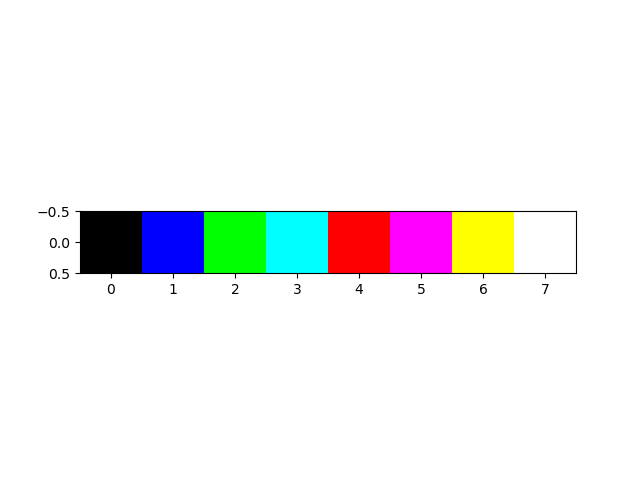

In [68]:
fig, ax = plt.subplots()
plt.imshow(pixels_255)

## 24- bit RGB Colour 

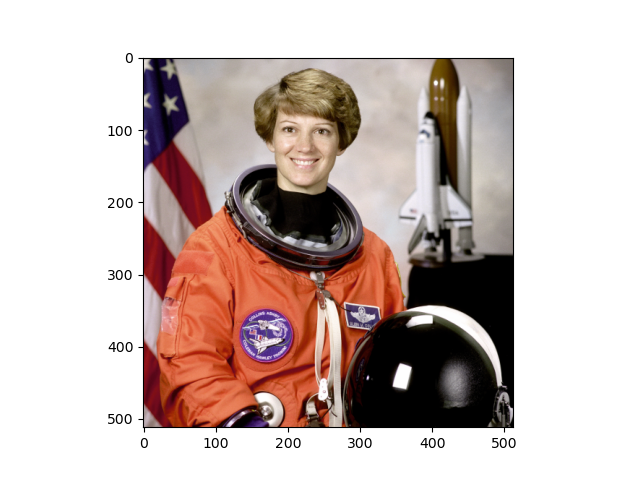

In [78]:
# Read an image from a folder 
image = skimage.io.imread(fname='sc_data/astronaut.tif')
#Display
fig, ax = plt.subplots()
plt.imshow(image)

In [84]:
# Extract all the colour information for a red pixel with coordinates [300, 3]
middle_left_pixel = image[300,3,:]  # We select the coordinates and leave the colour [R, G, B] array emplty
middle_left_pixel

array([141,  26,  19], dtype=uint8)

Click in a RED pixel at row 300 (y) and column 3(x) 
This outputs: array([ 141, 26, 19]) The integers in order represent Red, Green, and Blue. Looking at the 3 values and knowing how they map, can help us understand why it is red. If we divide each value by 255, which is the maximum, we can determine how much it is contributing relative to its maximum potential. Effectively, the red is at 141/255 or 55.3 percent of its potential, the green is at 26/255 or 10.2 percent, and blue is 19/255 or 7.5 percent of its potential. So when you mix those three intensities of colour, red is winning by a wide margin, and the green and blue  contribute to a minimum that's why it is a little bit different than absolute red.

These colours mapped to dimensions of the matrix may be referred to as channels. It may be helpful to display each of these channels independently, to help us understand what is happening. We can do that by multiplying our image array representation with a 1d matrix that has a one for the channel we want to keep and zeros for the rest.

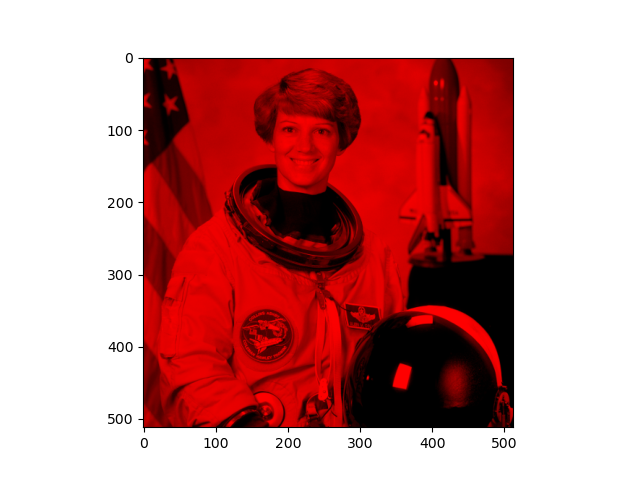

In [85]:
#Select the RED Channel
red_channel = image * [1,0,0]
fig, ax = plt.subplots()
plt.imshow(red_channel)

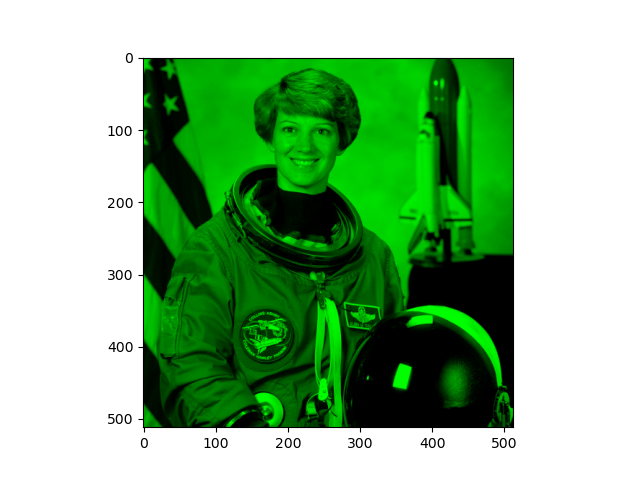

In [81]:
#Select the Green Channel
green_channel = image * [0,1,0]
fig, ax = plt.subplots()
plt.imshow(green_channel)

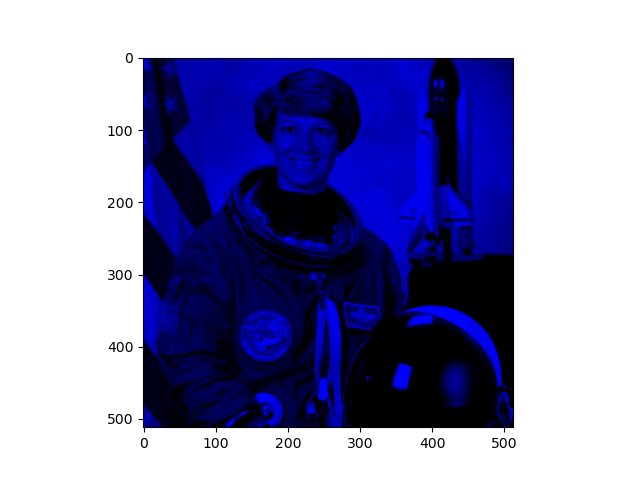

In [82]:
blue_channel = image * [0,0,1]
fig, ax = plt.subplots()
plt.imshow(blue_channel)

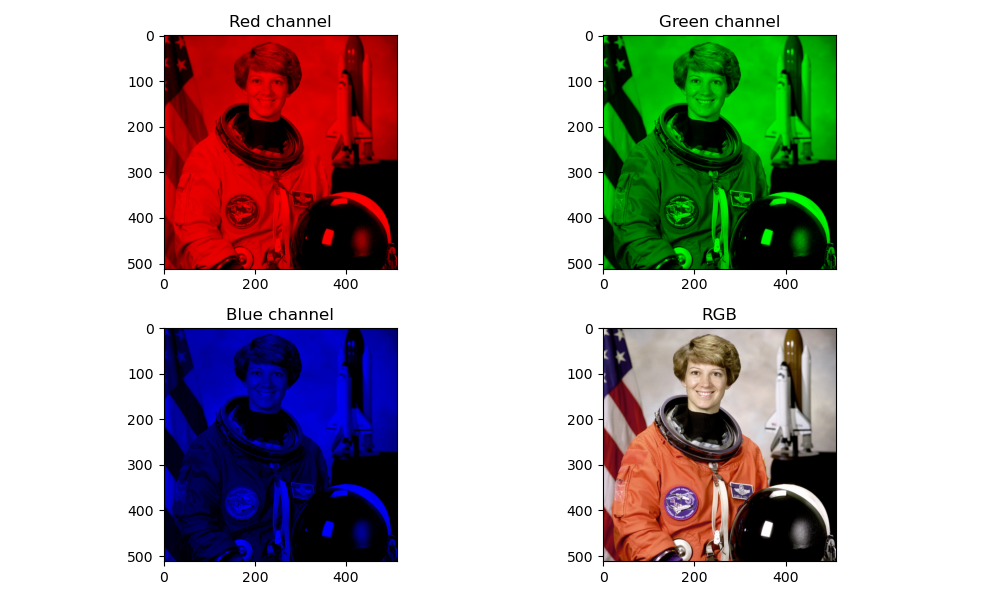

In [83]:
# Display the images in a figure 
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
axes[0, 0].imshow(red_channel)
axes[0, 0].set_title('Red channel')
axes[0, 1].imshow(green_channel)
axes[0, 1].set_title('Green channel')
axes[1, 0].imshow(blue_channel)
axes[1, 0].set_title('Blue channel')
axes[1, 1].imshow(image)
axes[1, 1].set_title('RGB')
plt.tight_layout()

## Colourmaps



![](https://matplotlib.org/stable/_images/sphx_glr_colormaps_001.png)
![](https://matplotlib.org/stable/_images/sphx_glr_colormaps_002.png)

From [Choosing Colormaps in Matplotlib](https://matplotlib.org/stable/tutorials/colors/colormaps.html)

In [70]:
array = skimage.io.imread(fname="sc_data/face_1.tif")

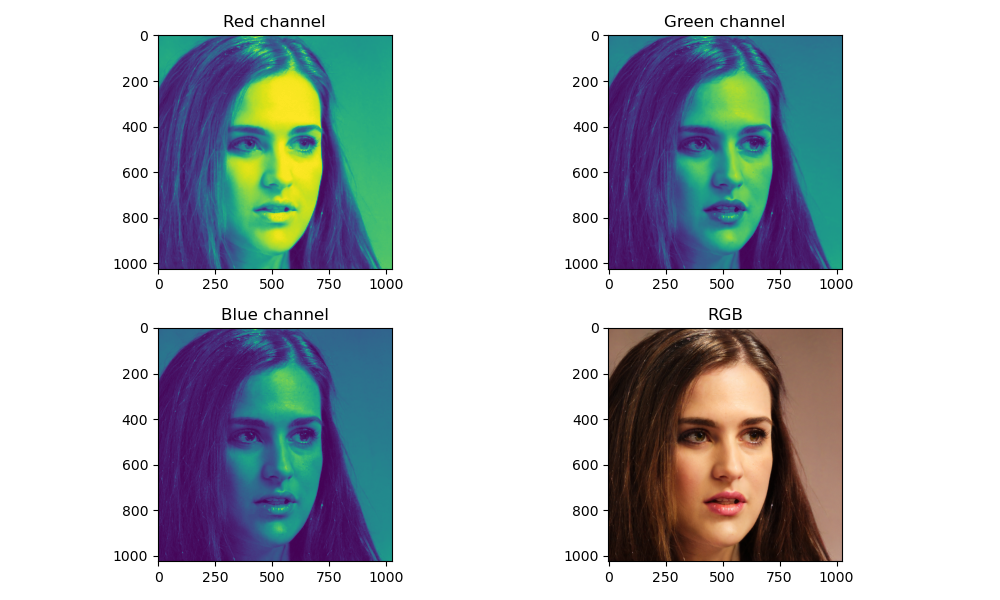

In [71]:
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
red, green, blue = [array[..., channel] for channel in range(3)] # This is an iterative process 
axes[0, 0].imshow(red)
axes[0, 0].set_title('Red channel')
axes[0, 1].imshow(green)
axes[0, 1].set_title('Green channel')
axes[1, 0].imshow(blue)
axes[1, 0].set_title('Blue channel')
axes[1, 1].imshow(image)
axes[1, 1].set_title('RGB')
plt.tight_layout()

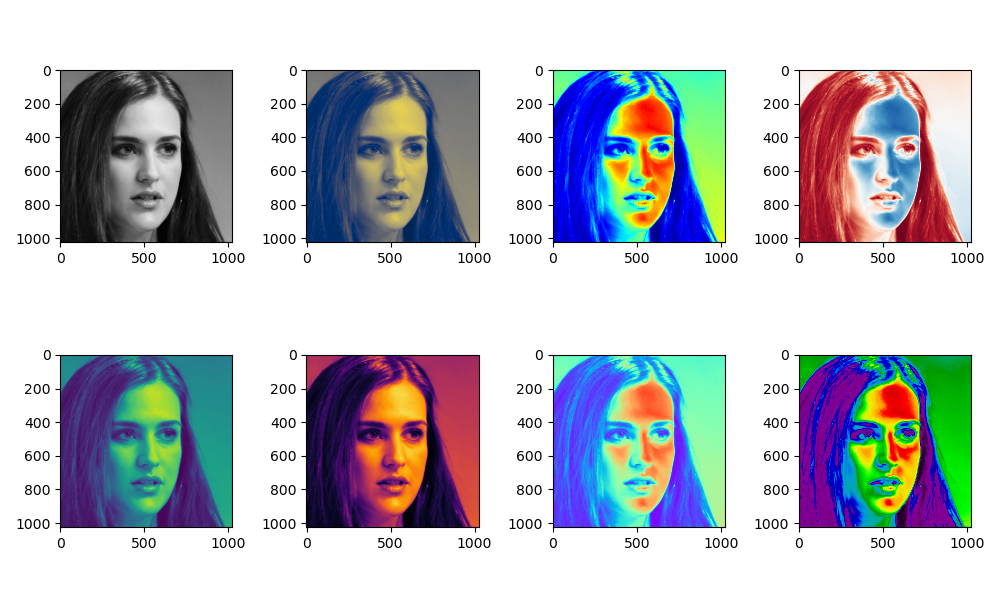

In [72]:
_, axes = plt.subplots(2, 4, figsize=(10, 6))
brightness = 0.2989 * red + 0.5870 * green + 0.1140 * blue
axes[0, 0].imshow(brightness, cmap='gray')
axes[1, 0].imshow(brightness, cmap='viridis')
axes[0, 1].imshow(brightness, cmap='cividis')
axes[1, 1].imshow(brightness, cmap='inferno')
axes[0, 2].imshow(brightness, cmap='jet')
axes[1, 2].imshow(brightness, cmap='rainbow')
axes[0, 3].imshow(brightness, cmap='RdBu')
axes[1, 3].imshow(brightness, cmap='nipy_spectral')
plt.tight_layout()

## MY SEARCH TO FIND PROPER IMAGES 

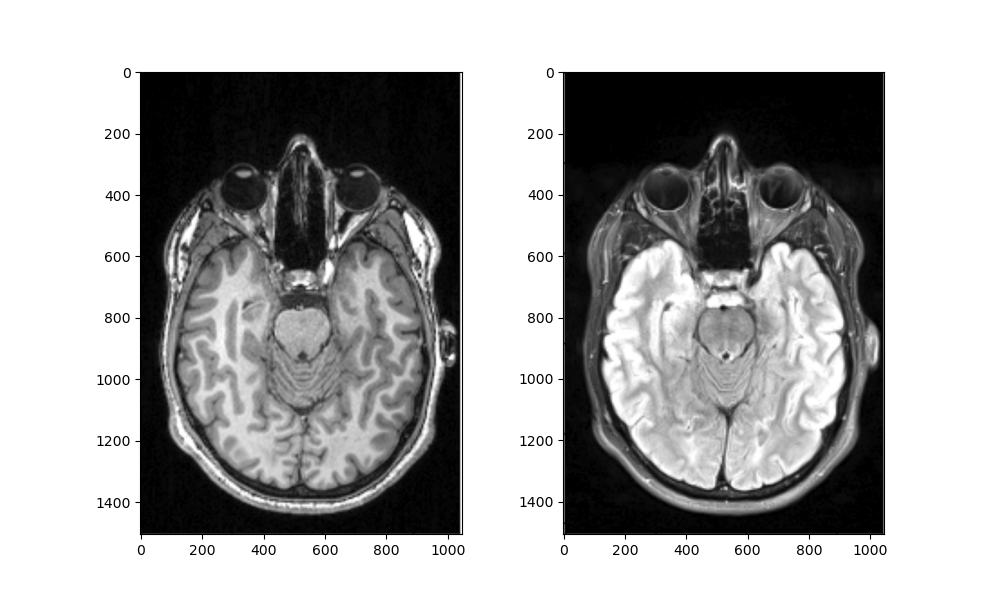

In [35]:
t1 = plt.imread('sc_data/t1.jpg')
t2 = plt.imread('sc_data/t2.jpg')
_, axes = plt.subplots(1, 2, figsize=(10, 6))
axes[0].imshow(t1, cmap='gray')
axes[1].imshow(t2, cmap='gray')

In [33]:
print(t1.shape)
print(t2.shape)

(1504, 1046)
(1506, 1046)


In [34]:
diff = t1 - t2

ValueError: operands could not be broadcast together with shapes (1504,1046) (1506,1046) 

# 4 Converting Colour images to grayscale

Grayscale images, have a single channel and is much easier to work with, instead of colour images, which have three channels. Skimage offers the function **skimage.color.rgb2gray()** to achieve this. This function adds up the three colour channels in a way that matches human colour perception, see the skimage documentation for details. It returns a grayscale image with floating point values in the range from 0 to 1. We can use the function skimage.util.img_as_ubyte() in order to convert it back to the original data type and the data range back 0 to 255. Note that it is often better to use image values represented by floating point values, because using floating point numbers is numerically more stable.

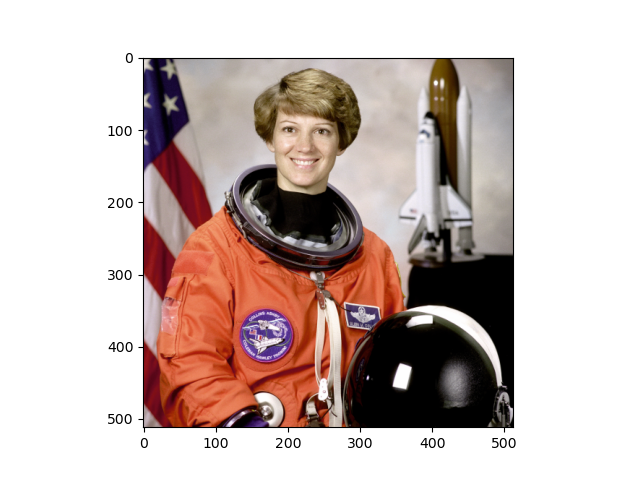

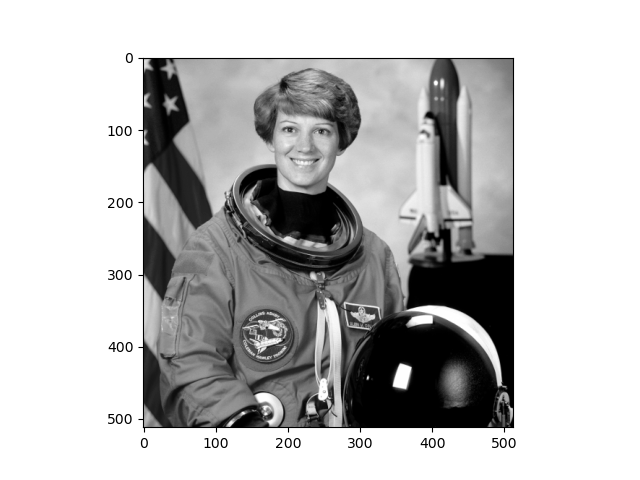

In [86]:
"""
* Python script to load a color image as grayscale.
"""
import skimage.io
import skimage.color

# read input image
image = skimage.io.imread(fname='sc_data/astronaut.tif')

# display original image
fig, ax = plt.subplots()
plt.imshow(image)

# convert to grayscale and display
gray_image = skimage.color.rgb2gray(image)
fig, ax = plt.subplots()
plt.imshow(gray_image, cmap="gray")

We can also load colour images as grayscale directly by passing the argument as_gray=True to skimage.io.imread().

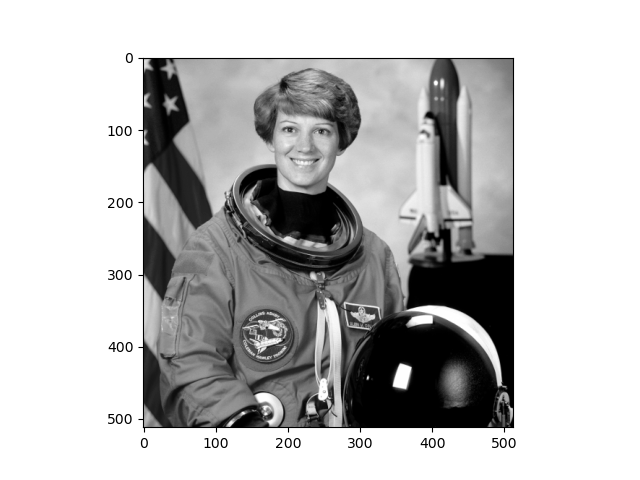

In [117]:
"""
* Python script to load a color image as grayscale.
"""
import skimage.io
import skimage.color

# read input image, based on filename parameter
image = skimage.io.imread(fname="sc_data/astronaut.tif", as_gray=True)

# display grayscale image
fig, ax = plt.subplots()
plt.imshow(image, cmap="gray")

## Manipulate pixels: Select particular colours

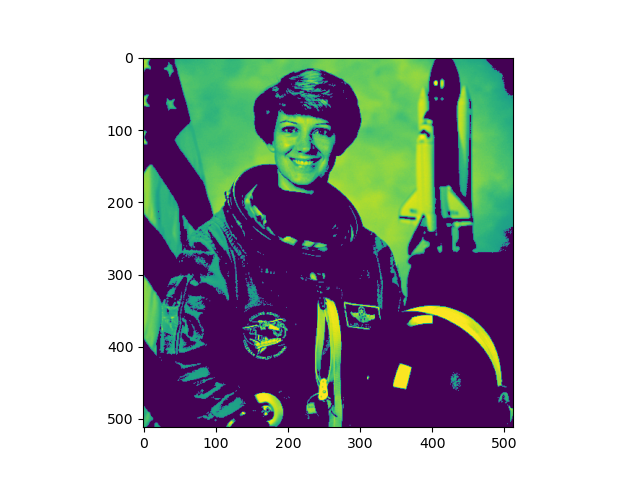

In [125]:
# Keep only high-intensity pixels of the gray scale image 
#mask =skimage.io.imread(fname="sc_data/astronaut.tif", as_gray=True)
#mask[image < 0.55] = 0 

#image[mask] 
#
image[image < 0.55] = 0

# display modified image
fig, ax = plt.subplots()
plt.imshow(image)

## My Question 
How would I make it look like a mask ?

##  HERE IS THE END- I WILL INCLUDE THE FOLLOWING TO ANOTHER NOTEBOOK

## ** --------------------------------**

## Access image areas via slicing 

As mentioned above skimage images are stored as NumPy arrays, so we can use array slicing to select rectangular areas of an image. Then, we can save the selection as a new image, change the pixels in the image, and so on. It is important to remember that coordinates are specified in (ry, cx) order and that colour values are specified in (r, g, b) order when doing these manipulations.

Consider this image of a face, and suppose that we want to create a sub-image with just the portion that covers the right eye. 

We can determine the coordinates of the corners of the area we wish to extract (the right eye) by hovering the mouse near the points of interest and noting the coordinates. If we do that, we might settle on a rectangular area with an upper-left coordinate of (290, 430) and a lower-right coordinate of (480, 530), as shown in this version of the face picture

## Insert the image face_coordinates.jpg


Note that the coordinates in the preceding image are specified in **(cx, ry)** order. Now if our entire face image is stored as an skimage image named face_image, we can create a new image of the selected region with a statement like this:

eye= face_image[430:530, 290:480, :]

Our array slicing specifies the range of y-coordinates or rows first, 430:530, and then the range of x-coordinates or columns, 290:481. Note we go one beyond the maximum value in each dimension, so that the entire desired area is selected. The third part of the slice, :, indicates that we want all three colour channels in our new image.

A script to create the subimage would start by loading the image:

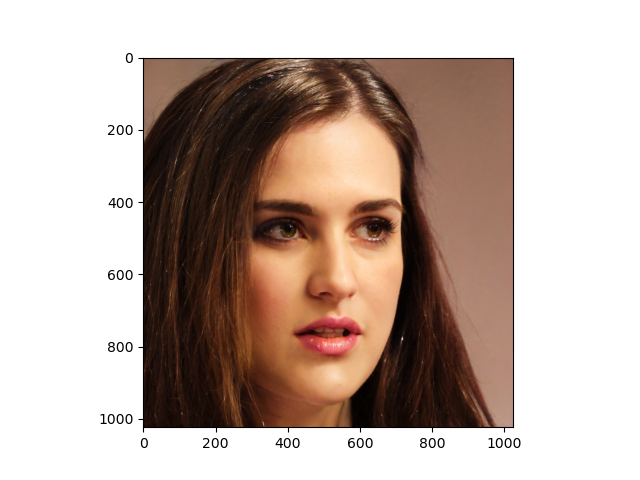

In [32]:
"""
 * Python script demonstrating image modification and creation via
 * NumPy array slicing.
"""
import skimage.io

# load and display original image
image = skimage.io.imread(fname="sc_data/face_1.tif")
fig, ax = plt.subplots()
plt.imshow(image)

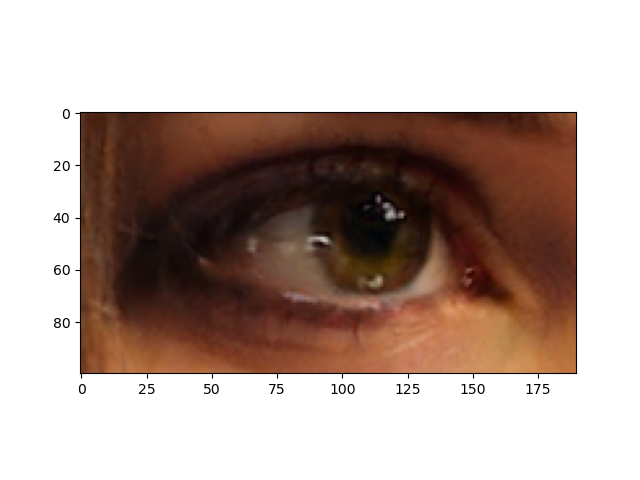

In [31]:
# extract, display, and save sub-image
fig, ax = plt.subplots()
eye = image[430:530, 290:480, :]
plt.imshow(eye)
skimage.io.imsave(fname="sc_data/eye.tif", arr=eye)

## Key Points

- Images are read with the skimage.io.imread() function.
- We create a window that automatically scales the displayed image with matplotlib and calling show() on the global figure object.
- Pixels are accessed in the image vi the NumPy library
- In a usual 24 bit RGB colour depth represantations are 8 bit Read [0, 255], 8 bit Green [0, 255], 8 bit Blue [0, 255].
- colour images can be transformed to grayscale using skimage.color.rgb2gray() or be read as grayscale directly by passing the argument as_gray=True to skimage.io.imread().